In [876]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
from scipy import stats
plt.style.use('default')
import warnings 
warnings.filterwarnings('ignore')

In [877]:
# import the oil pordcution data 
# each well is identified by the well name and location 
# the prodcution days and total prodcution of oil and water are provided
# the production rate is the total production over the total days and gives you barrels per day
prodcution= pd.read_csv('Oil_production_data.csv')
prodcution.head()

,Well_No,Total_Days_of_Production,Total_Prodcution,Oil_Production_Rate,Water_Production
0,7250,2444,53670,22,0
1,11996,2013,117630,58,1719
2,12550,3417,66420,19,899
3,14090,1624,58290,36,0
4,14104,5042,76680,15,1435


In [878]:
# import the geostatistics data
# each well has multiple data that includes the location 
# well depth: is the total depth that the well is drilled to 
# top depth: is the top depth of the prodcution zone 
# bottom depth: is the bottom depth of the prodcution zone
# thickness: is the total oil production zone (bottom depth - top depth)
# porosity: volume of void space, which can be filled with different reservoir fluids (e.g., oil, gas, water) - from core or logs
# water saturation: the ratio of water volume to pore volume. 
# permeability: the ability of these fluids to flow within and between the pore space
geo= pd.read_csv('Geostatistics_data.csv')
geo.head()

,Well_No,Latitude,Longitude,Well_Depth,Top_Depth,Bottom_Depth,Pay_thickness,Porosity,Water_Sat,Permeability
0,29666,40.175046,-104.649316,7357,6874,7114.0,240.0,12.500000,46.427291,0.435936
1,23198,40.179870,-104.642320,7284,6807,7070.0,263.0,8.333333,66.950288,0.014946
2,23197,40.180190,-104.647260,7279,6829,7060.0,231.0,9.523810,66.575700,0.033673
3,26545,40.182316,-104.654276,7307,6855,7067.0,212.0,8.333333,63.245553,0.008143
4,23249,40.176520,-104.656680,7312,6825,7054.0,229.0,10.119048,71.411765,0.054950


In [879]:
# both data are merged based on the well number 
data = pd.merge(geo, prodcution, on='Well_No', how='inner')
data.head()

,Well_No,Latitude,Longitude,Well_Depth,Top_Depth,Bottom_Depth,Pay_thickness,Porosity,Water_Sat,Permeability,Total_Days_of_Production,Total_Prodcution,Oil_Production_Rate,Water_Production
0,29666,40.175046,-104.649316,7357,6874,7114.0,240.0,12.500000,46.427291,0.435936,1107,93390,84,352
1,23198,40.179870,-104.642320,7284,6807,7070.0,263.0,8.333333,66.950288,0.014946,2843,90306,32,1883
2,23197,40.180190,-104.647260,7279,6829,7060.0,231.0,9.523810,66.575700,0.033673,2882,93306,32,1793
3,26545,40.182316,-104.654276,7307,6855,7067.0,212.0,8.333333,63.245553,0.008143,2045,70710,35,1414
4,23249,40.176520,-104.656680,7312,6825,7054.0,229.0,10.119048,71.411765,0.054950,2817,79716,28,1731


In [880]:
# have summary statistics for selected data 
data[['Well_Depth', 'Top_Depth', 'Bottom_Depth', 'Pay_thickness ', 
                    'Porosity', 'Water_Sat', 'Permeability', 
                    'Total_Days_of_Production', 'Total_Prodcution ', 
                    'Oil_Production_Rate', 'Water_Production ']].describe()


,Well_Depth,Top_Depth,Bottom_Depth,Pay_thickness,Porosity,Water_Sat,Permeability,Total_Days_of_Production,Total_Prodcution,Oil_Production_Rate,Water_Production
count,137.000000,137.000000,137.000000,137.000000,123.000000,123.000000,123.000000,137.000000,137.000000,137.000000,137.000000
mean,8008.934307,6897.518248,7113.613139,216.094891,11.249525,55.522213,0.240730,2258.883212,124729.007299,58.218978,1635.489051
std,1510.638793,162.552349,158.870924,36.331325,2.697631,9.479820,0.331228,1666.446523,111573.722244,43.648785,1403.305112
min,7175.000000,6722.000000,6932.000000,91.000000,6.547619,40.123527,0.001567,154.000000,10200.000000,4.000000,0.000000
25%,7286.000000,6824.000000,7040.000000,196.000000,8.928571,47.859259,0.018479,715.000000,45882.000000,31.000000,706.000000
50%,7725.000000,6847.000000,7065.000000,215.000000,10.733745,56.139696,0.048565,1934.000000,77388.000000,46.000000,1322.000000
75%,7845.000000,6896.000000,7121.000000,240.000000,13.339286,61.642033,0.427284,3113.000000,188982.000000,70.000000,2005.000000
max,16651.000000,7921.000000,8077.000000,335.000000,16.986565,78.987561,1.445005,5192.000000,503730.000000,277.000000,9624.000000


In [881]:
# calc the total prodcued oil 
total_oilproduction = data['Total_Prodcution '].sum()
print(f"Total Oil Production from all wells: {total_oilproduction}")


Total Oil Production from all wells: 17087874


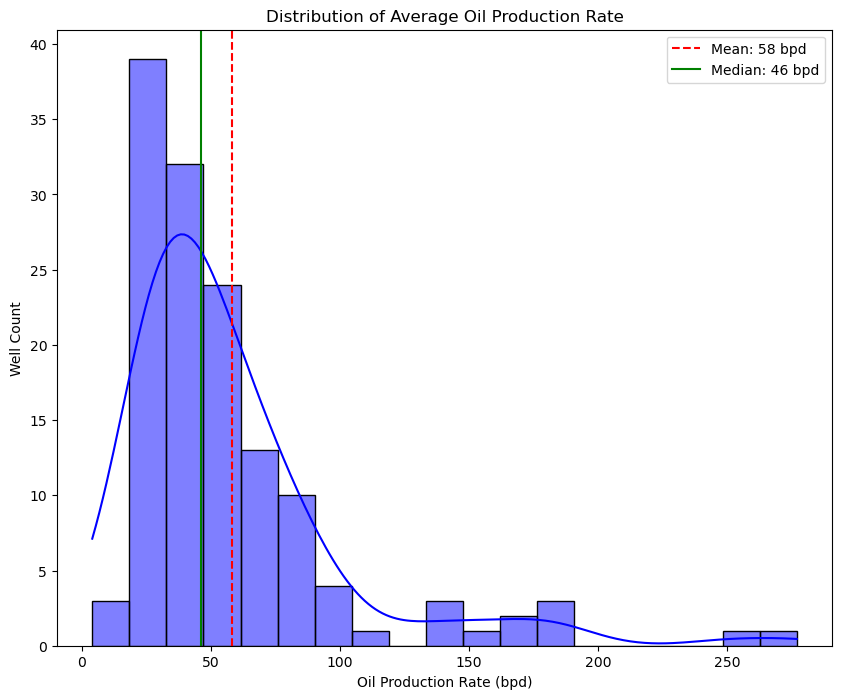

In [882]:
# analyze the ave prodcution for this part of the field 

plt.figure(figsize=(10, 8))
sns.histplot(data['Oil_Production_Rate'], kde=True, color='blue')

# Calculating mean and median for the oil production rate
oilp_mean = data['Oil_Production_Rate'].mean()
oilp_median = data['Oil_Production_Rate'].median()
plt.axvline(oilp_mean, color='red', linestyle='--', label=f'Mean: {oilp_mean:.0f} bpd')
plt.axvline(oilp_median, color='green', linestyle='-', label=f'Median: {oilp_median:.0f} bpd')
plt.title('Distribution of Average Oil Production Rate')
plt.xlabel('Oil Production Rate (bpd)')
plt.ylabel('Well Count')
plt.legend()
plt.show()


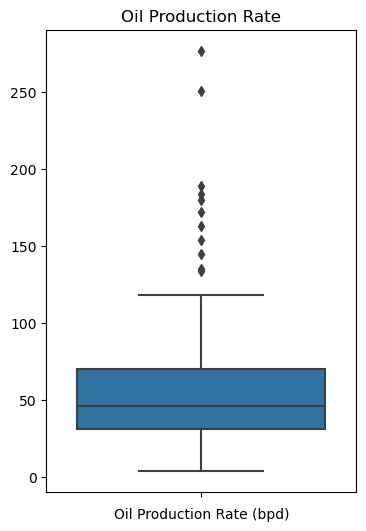

In [883]:
plt.figure(figsize=(4,6))
sns.boxplot(y=data['Oil_Production_Rate'])
plt.title('Oil Production Rate')
plt.xlabel('Oil Production Rate (bpd)')
plt.ylabel('')
plt.show()

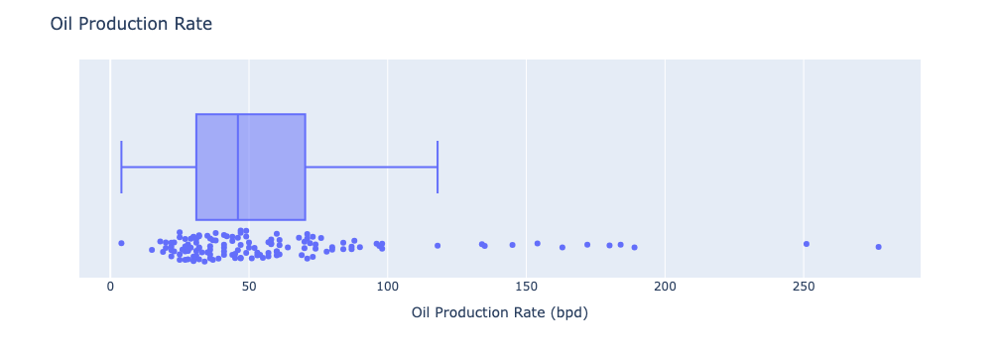

In [884]:
import plotly.express as px
fig = px.box(data, x="Oil_Production_Rate", points='all')
fig.update_layout(
    title='Oil Production Rate',
    xaxis_title='Oil Production Rate (bpd)')
fig.show()

In [885]:
# Classifying the oil production rate into High, Low, and Average categories 
# Based on EIA the average production rate in the US is 26-30 bpd and based on our rate the mean and meadin are between 46-58 bpd
def classify_production_rate(rate):
    if rate < 26:
        return 'Low'
    elif 30 <= rate <= 60:
        return 'Average'
    else:
        return 'High'
data['Production_Class'] = data['Oil_Production_Rate'].apply(classify_production_rate)
data.head()

,Well_No,Latitude,Longitude,Well_Depth,Top_Depth,Bottom_Depth,Pay_thickness,Porosity,Water_Sat,Permeability,Total_Days_of_Production,Total_Prodcution,Oil_Production_Rate,Water_Production,Production_Class
0,29666,40.175046,-104.649316,7357,6874,7114.0,240.0,12.500000,46.427291,0.435936,1107,93390,84,352,High
1,23198,40.179870,-104.642320,7284,6807,7070.0,263.0,8.333333,66.950288,0.014946,2843,90306,32,1883,Average
2,23197,40.180190,-104.647260,7279,6829,7060.0,231.0,9.523810,66.575700,0.033673,2882,93306,32,1793,Average
3,26545,40.182316,-104.654276,7307,6855,7067.0,212.0,8.333333,63.245553,0.008143,2045,70710,35,1414,Average
4,23249,40.176520,-104.656680,7312,6825,7054.0,229.0,10.119048,71.411765,0.054950,2817,79716,28,1731,High


In [886]:
data['Production_Class'].value_counts()

Production_Class
Average    67
High       54
Low        16
Name: count, dtype: int64

In [887]:
data['Production_Class'].value_counts(normalize=True) * 100

Production_Class
Average    48.905109
High       39.416058
Low        11.678832
Name: proportion, dtype: float64

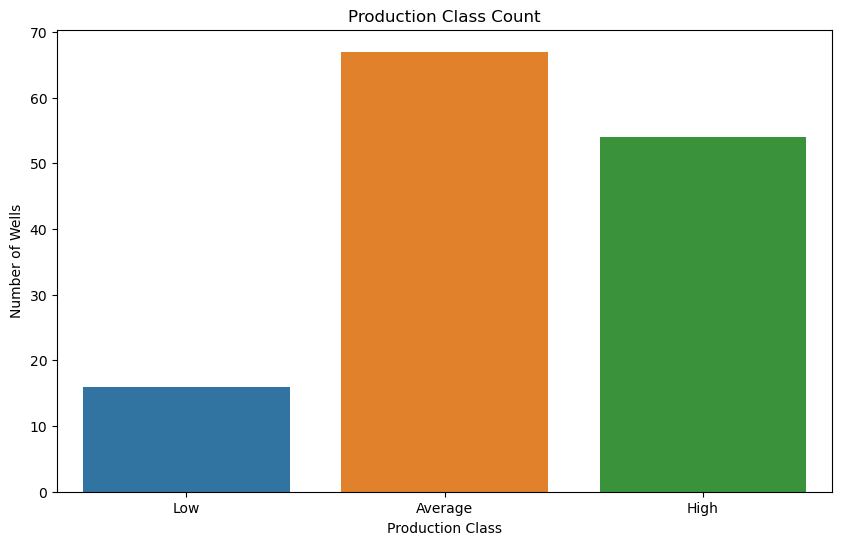

In [889]:
plt.figure(figsize=(10, 6))
sns.countplot(x=data['Production_Class'], order=['Low', 'Average', 'High'])

plt.title('Production Class Count')
plt.xlabel('Production Class')
plt.ylabel('Number of Wells')
plt.show()

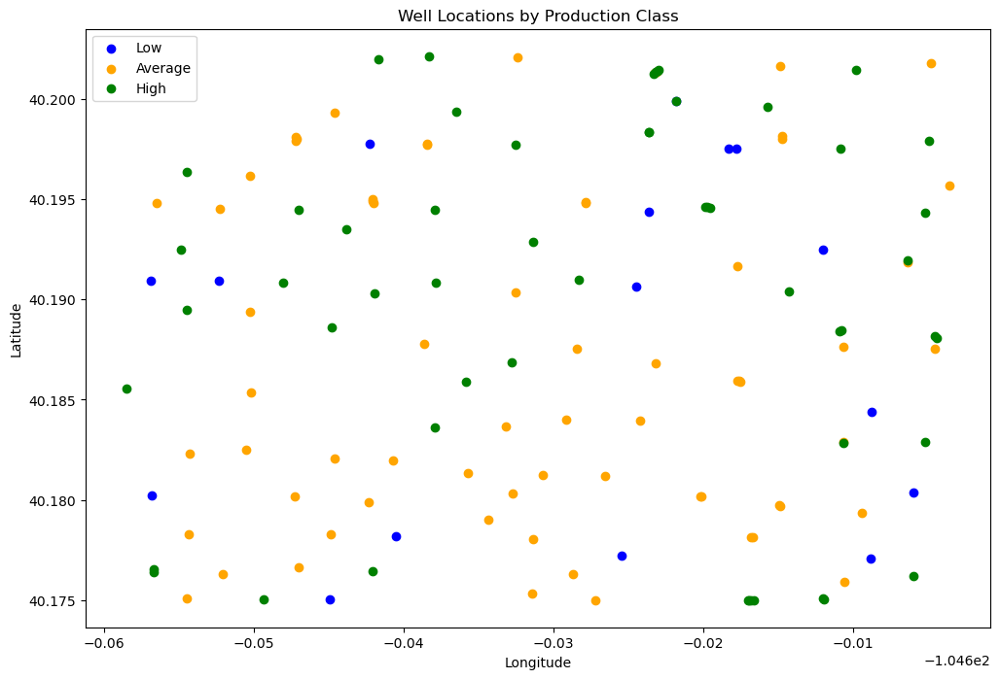

In [896]:
# Identify the well locations by classfication 
color_map = {'Low': 'blue', 'Average': 'orange', 'High': 'green'}
plt.figure(figsize=(12, 8))
for production_class, color in color_map.items():
    subset = data[data['Production_Class'] == production_class]
    plt.scatter(subset['Longitude'], subset['Latitude'], color=color, label=production_class)

plt.title('Well Locations by Production Class')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()


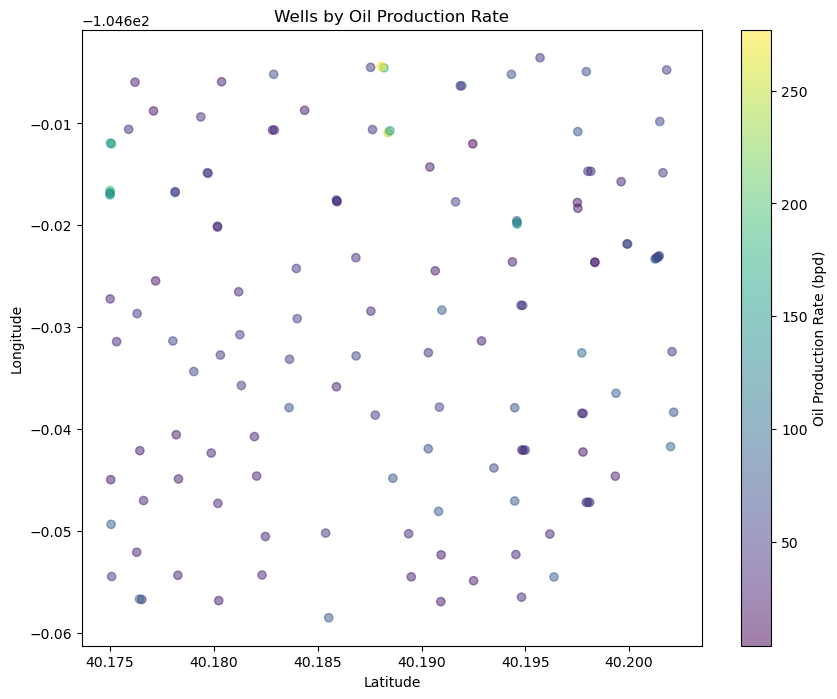

In [897]:
plt.figure(figsize=(10, 8))
sc = plt.scatter(data['Latitude'], data['Longitude'], 
                 c=data['Oil_Production_Rate'], cmap='viridis', alpha=0.5)
plt.colorbar(sc, label='Oil Production Rate (bpd)')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.title('Wells by Oil Production Rate')
plt.show()

In [898]:
# Add a clasiifcation based on location 
# Calculating the central point
central_latitude = data['Latitude'].mean()
central_longitude = data['Longitude'].mean()

# classify each well based on location
def classify_location(latitude, longitude):
    lat_class = 'North' if latitude > central_latitude else 'South'
    long_class = 'East' if longitude > central_longitude else 'West'
    return f'{lat_class}-{long_class}'

data['Location_Class'] = data.apply(lambda x: classify_location(x['Latitude'], x['Longitude']), axis=1)
data.head()


,Well_No,Latitude,Longitude,Well_Depth,Top_Depth,Bottom_Depth,Pay_thickness,Porosity,Water_Sat,Permeability,Total_Days_of_Production,Total_Prodcution,Oil_Production_Rate,Water_Production,Production_Class,Location_Class
0,29666,40.175046,-104.649316,7357,6874,7114.0,240.0,12.500000,46.427291,0.435936,1107,93390,84,352,High,South-West
1,23198,40.179870,-104.642320,7284,6807,7070.0,263.0,8.333333,66.950288,0.014946,2843,90306,32,1883,Average,South-West
2,23197,40.180190,-104.647260,7279,6829,7060.0,231.0,9.523810,66.575700,0.033673,2882,93306,32,1793,Average,South-West
3,26545,40.182316,-104.654276,7307,6855,7067.0,212.0,8.333333,63.245553,0.008143,2045,70710,35,1414,Average,South-West
4,23249,40.176520,-104.656680,7312,6825,7054.0,229.0,10.119048,71.411765,0.054950,2817,79716,28,1731,High,South-West


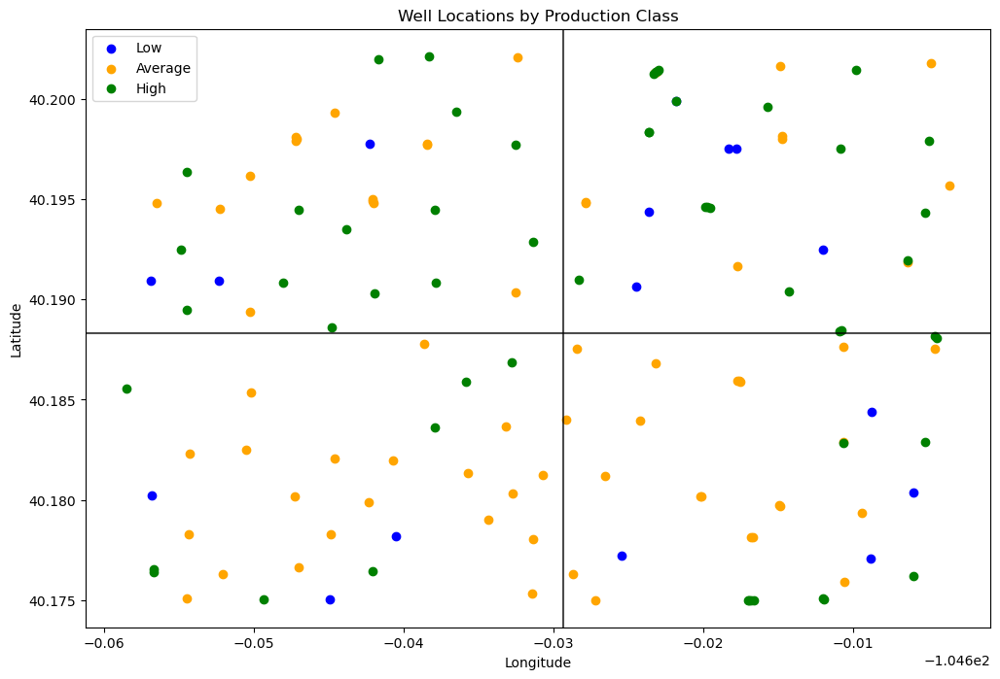

In [899]:
plt.figure(figsize=(12, 8))
color_map = {'Low': 'blue', 'Average': 'orange', 'High': 'green'}
for production_class, color in color_map.items():
    subset = data[data['Production_Class'] == production_class]
    plt.scatter(subset['Longitude'], subset['Latitude'], color=color, label=production_class)
central_latitude = data['Latitude'].mean()
central_longitude = data['Longitude'].mean()
plt.axhline(y=central_latitude, color='black', linestyle='-', alpha=0.7)
plt.axvline(x=central_longitude, color='black', linestyle='-', alpha=0.7)

plt.title('Well Locations by Production Class')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()


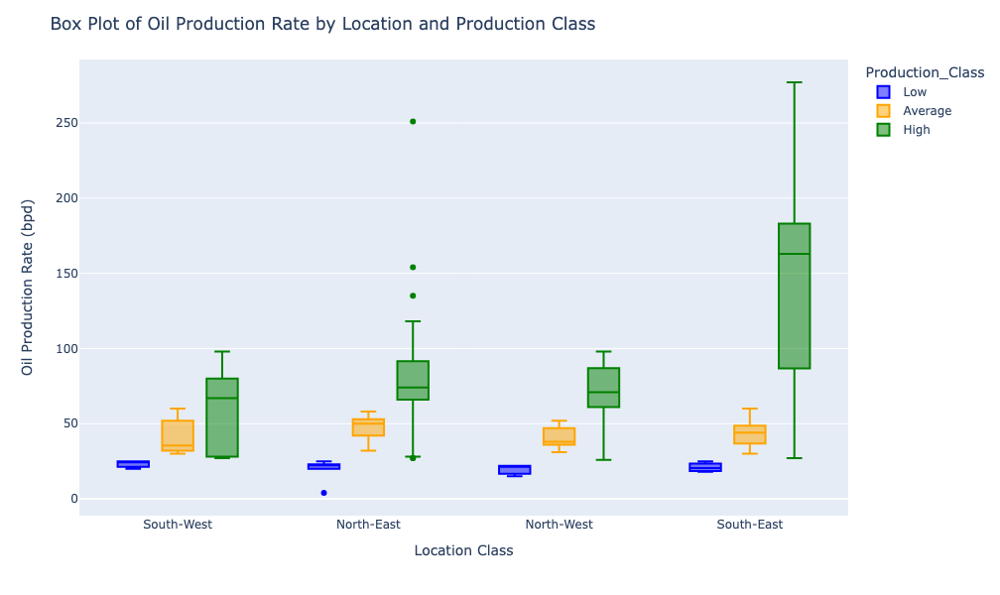

In [900]:
import plotly.express as px

# Define color map for 'Production_Class'
color_discrete_map = {'High': 'green', 'Average': 'orange', 'Low': 'blue'}

# Create the box plot with specified category order
fig = px.box(data, x="Location_Class", y="Oil_Production_Rate", color="Production_Class", 
             labels={"Oil_Production_Rate": "Oil Production Rate (bpd)"},
             color_discrete_map=color_discrete_map,
             category_orders={"Production_Class": ["Low", "Average", "High"]})

# Update layout
fig.update_layout(
    title='Box Plot of Oil Production Rate by Location and Production Class',
    xaxis_title='Location Class',
    yaxis_title='Oil Production Rate (bpd)',
    width=800,  # Width of the figure
    height=600   # Height of the figure
)

# Show the figure
fig.show()


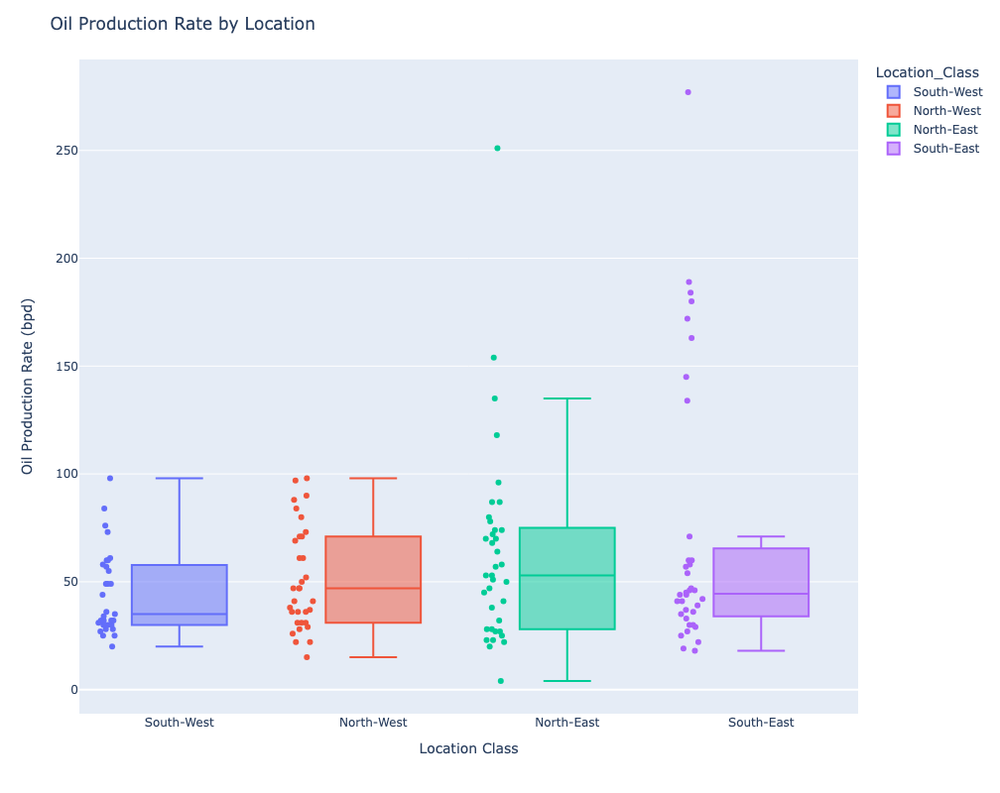

In [901]:
fig = px.box(data, x="Location_Class", y="Oil_Production_Rate", points='all', color="Location_Class", 
             labels={"Oil_Production_Rate": "Oil Production Rate (bpd)"})
fig.update_layout(
    title='Oil Production Rate by Location',
    xaxis_title='Location Class',
    yaxis_title='Oil Production Rate (bpd)',
    width=1000,
    height=800)
fig.show()

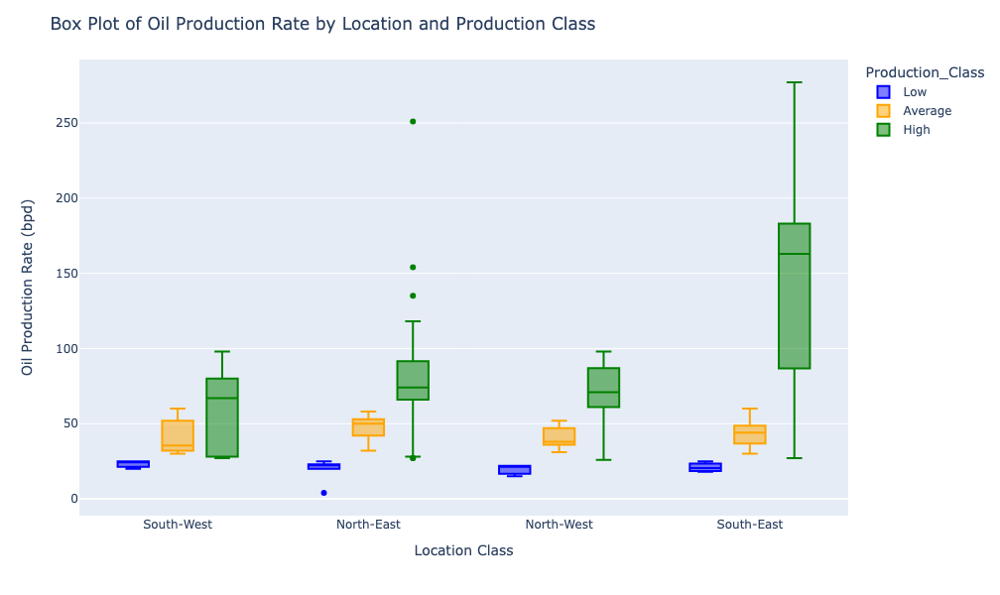

In [902]:
import plotly.express as px

# Define color map for 'Production_Class'
color_discrete_map = {'High': 'green', 'Average': 'orange', 'Low': 'blue'}

# Create the box plot with specified category order
fig = px.box(data, x="Location_Class", y="Oil_Production_Rate", color="Production_Class", 
             labels={"Oil_Production_Rate": "Oil Production Rate (bpd)"},
             color_discrete_map=color_discrete_map,
             category_orders={"Production_Class": ["Low", "Average", "High"]})

# Update layout
fig.update_layout(
    title='Box Plot of Oil Production Rate by Location and Production Class',
    xaxis_title='Location Class',
    yaxis_title='Oil Production Rate (bpd)',
    width=1000,  # Width of the figure
    height=600   # Height of the figure
)

# Show the figure
fig.show()


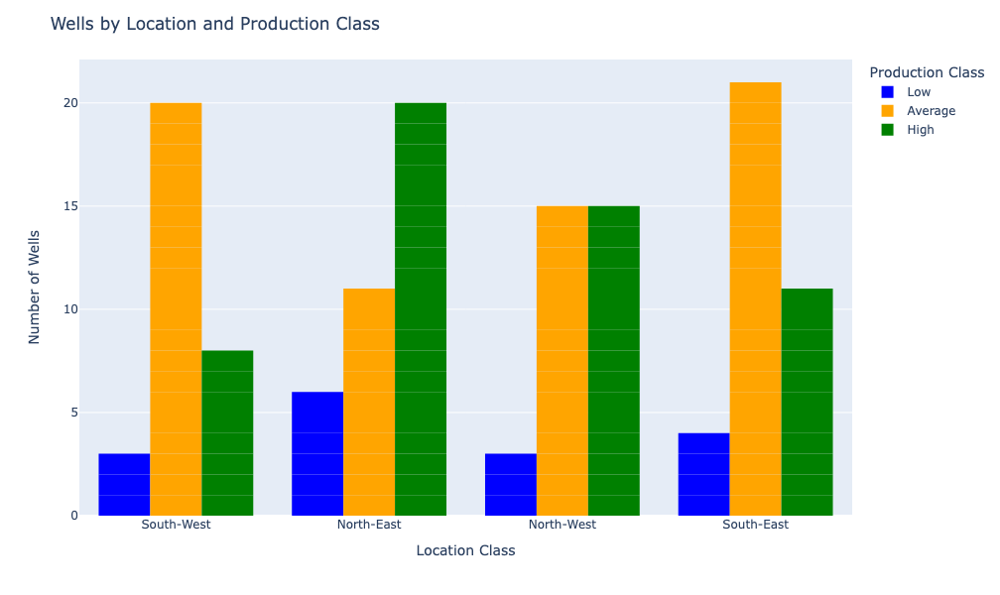

In [903]:
import plotly.express as px

# Create a grouped bar chart using Plotly Express
fig = px.bar(data, x='Location_Class', color='Production_Class',
             category_orders={'Production_Class': ['Low', 'Average', 'High']},
             color_discrete_map={'Low': 'blue', 'Average': 'orange', 'High': 'green'},
             barmode='group')

# Update layout to remove gridlines
fig.update_layout(
    title='Wells by Location and Production Class',
    xaxis_title='Location Class',
    yaxis_title='Number of Wells',
    legend_title='Production Class',
    width=1000,  # Width of the figure
    height=600,  # Height of the figure
    
)

# Remove the white lines (borders) on the bars
fig.update_traces(marker_line_width=0)

# Show the figure
fig.show()


In [904]:
import folium

# Creating a map centered around the mean latitude and longitude of the wells
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
well_map = folium.Map(location=map_center, zoom_start=10)


# Adding markers for each well
for index, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        popup=f'Well: {row["Well_No"]}<br>Production Class: {row["Production_Class"]}<br>Location Class: {row["Location_Class"]}',
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(well_map)

# Displaying the map
well_map

In [905]:
import folium

map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
well_map = folium.Map(location=map_center, zoom_start=10)
color_map = {'Low': 'blue', 'Average': 'orange', 'High': 'green'}
for _, row in data.iterrows():
    tooltip_text = f'Well: {row["Well_No"]}, {row["Production_Class"]}'
    popup_text = (f'Well: {row["Well_No"]}<br>'
                  f'Lat, Long: {row["Latitude"]}, {row["Longitude"]}<br>'
                  f'Production Class: {row["Production_Class"]}<br>'
                  f'Location Class: {row["Location_Class"]}')

    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=tooltip_text,
        color=color_map[row['Production_Class']],
        fill=True,
        fill_color=color_map[row['Production_Class']]
    ).add_to(well_map)

well_map


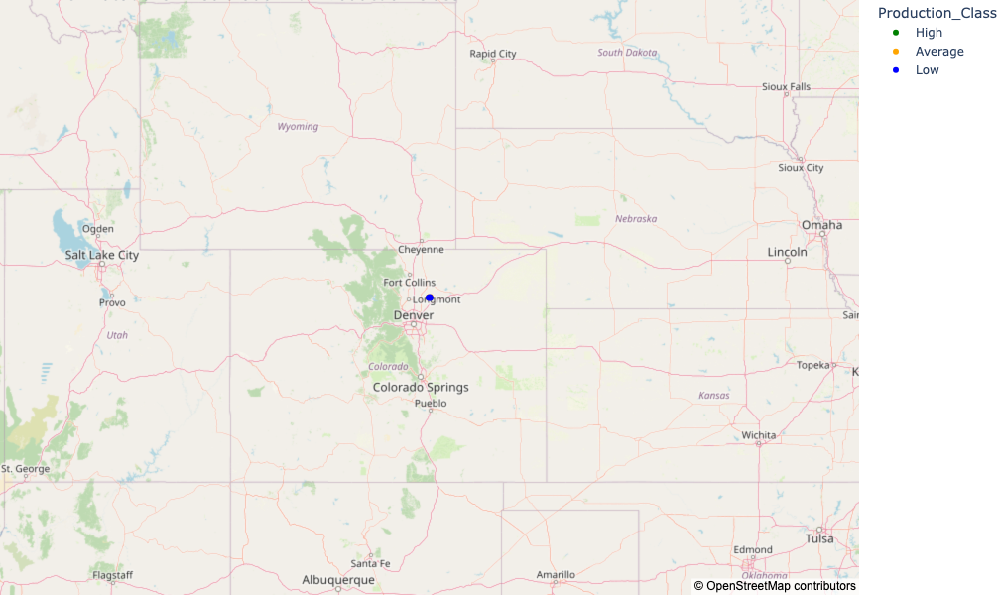

In [907]:
import plotly.express as px

color_discrete_map = {'Low': 'blue', 'Average': 'orange', 'High': 'green'}

fig = px.scatter_mapbox(data,
                        lat="Latitude",
                        lon="Longitude",
                        color="Production_Class",
                        color_discrete_map=color_discrete_map,
                        hover_name="Well_No",
                        hover_data={"Latitude": True, "Longitude": True, "Production_Class": True, "Location_Class": True},
                        zoom=5,
                        height=600)

fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(center=dict(lat=data['Latitude'].mean(), lon=data['Longitude'].mean())))

fig.update_layout(margin={"r":0, "t":0, "l":0, "b":0},
                  title="Well Locations in Colorado with Production Class")

fig.show()



<Axes: >

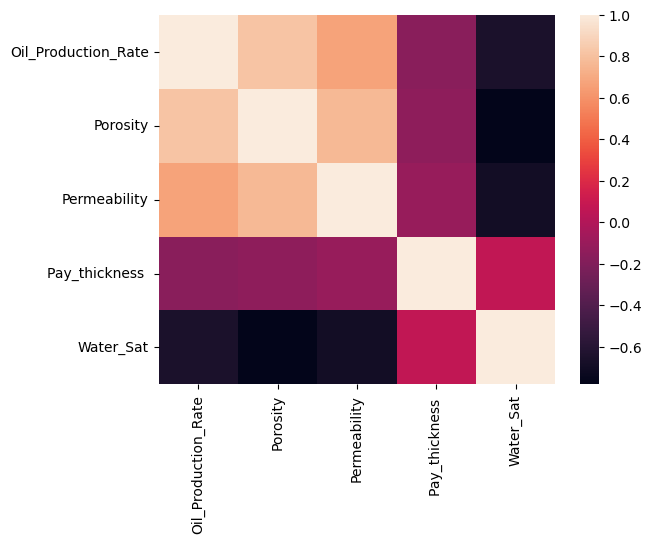

In [908]:
data_matrix=data[['Oil_Production_Rate', 'Porosity', 'Permeability', 'Pay_thickness ', 'Water_Sat']].corr()
sns.heatmap(data_matrix)

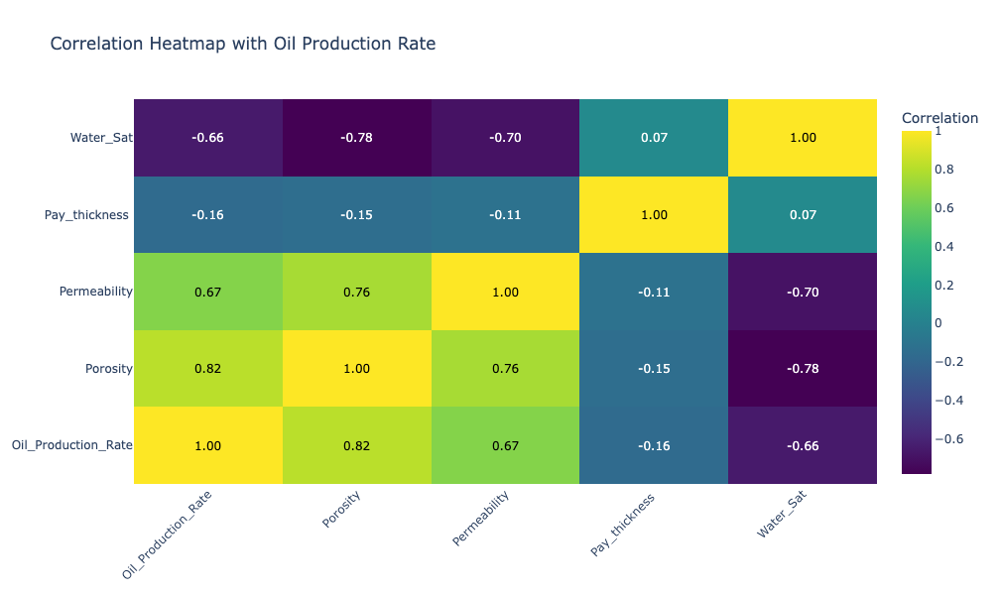

In [909]:
import plotly.graph_objects as go
import pandas as pd

# Assuming 'data' is your pandas DataFrame
# Replace 'data' with your actual DataFrame variable
correlation_matrix = data[['Oil_Production_Rate', 'Porosity', 'Permeability', 'Pay_thickness ', 'Water_Sat']].corr()

# Create the heatmap
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='Viridis',  # Change to your preferred color scale
    colorbar=dict(title='Correlation'),
))

# Add annotations for the correlation values
for i, row in enumerate(correlation_matrix.values):
    for j, value in enumerate(row):
        fig.add_annotation(dict(
            font=dict(color="white" if value < 0.5 else "black", size=12),
            x=correlation_matrix.columns[j],
            y=correlation_matrix.columns[i],
            text="{:.2f}".format(value),
            showarrow=False,
            xref="x",
            yref="y"
        ))

fig.update_layout(
    title='Correlation Heatmap with Oil Production Rate',
    xaxis=dict(tickangle=-45),
    autosize=False,
    width=600,
    height=600,
)

fig.show()


In [910]:
import statsmodels.api as sm

X = data[['Porosity']]  
y = data['Oil_Production_Rate'] 
X = sm.add_constant(X)
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)
y = y[X.index]  
model = sm.OLS(y, X).fit()
model_summary = model.summary()
print(model_summary)


                             OLS Regression Results                            
Dep. Variable:     Oil_Production_Rate   R-squared:                       0.667
Model:                             OLS   Adj. R-squared:                  0.664
Method:                  Least Squares   F-statistic:                     242.0
Date:                 Mon, 27 Nov 2023   Prob (F-statistic):           1.21e-30
Time:                         22:28:29   Log-Likelihood:                -575.13
No. Observations:                  123   AIC:                             1154.
Df Residuals:                      121   BIC:                             1160.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -92.9721     10.163     -9.14

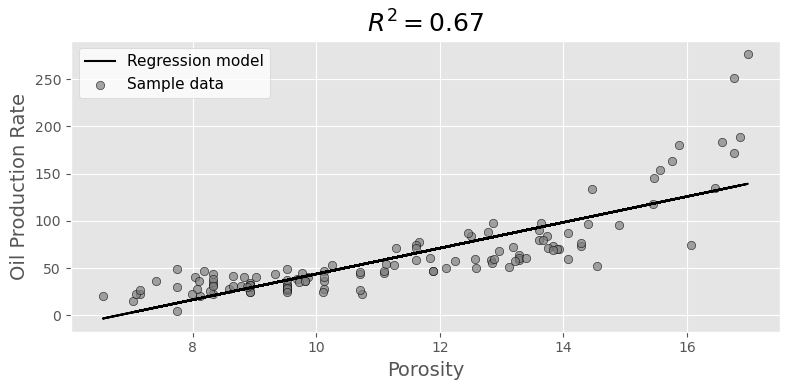

In [911]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np

# Assuming 'data' has 'Porosity' and 'Oil_Production_Rate' columns

# Prepare the data
X = data[['Porosity']]
y = data['Oil_Production_Rate']
X = sm.add_constant(X)
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)
y = y[X.index]

# Fit the model
model = sm.OLS(y, X).fit()

# Make predictions
X['Predictions'] = model.predict(X)

# R-squared value
r2 = model.rsquared

# Plot
plt.style.use('default')
plt.style.use('ggplot')

fig, ax = plt.subplots(figsize=(8, 4))

ax.plot(X['Porosity'], X['Predictions'], color='k', label='Regression model')
ax.scatter(X['Porosity'], y, edgecolor='k', facecolor='grey', alpha=0.7, label='Sample data')
ax.set_ylabel('Oil Production Rate', fontsize=14)
ax.set_xlabel('Porosity', fontsize=14)
ax.legend(facecolor='white', fontsize=11)
ax.set_title(f'$R^2= {r2:.2f}$', fontsize=18)

fig.tight_layout()
plt.show()


In [912]:
import statsmodels.api as sm

X = data[['Permeability']]  
y = data['Oil_Production_Rate'] 
X = sm.add_constant(X)
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)
y = y[X.index]  
model = sm.OLS(y, X).fit()
model_summary = model.summary()
print(model_summary)


                             OLS Regression Results                            
Dep. Variable:     Oil_Production_Rate   R-squared:                       0.444
Model:                             OLS   Adj. R-squared:                  0.439
Method:                  Least Squares   F-statistic:                     96.54
Date:                 Mon, 27 Nov 2023   Prob (F-statistic):           4.16e-17
Time:                         22:28:34   Log-Likelihood:                -606.61
No. Observations:                  123   AIC:                             1217.
Df Residuals:                      121   BIC:                             1223.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           38.9316      3.775    

In [913]:
import statsmodels.api as sm

X = data[['Permeability', 'Porosity']]  
y = data['Oil_Production_Rate'] 
X = sm.add_constant(X)
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)
y = y[X.index]  
model = sm.OLS(y, X).fit()
model_summary = model.summary()
print(model_summary)

                             OLS Regression Results                            
Dep. Variable:     Oil_Production_Rate   R-squared:                       0.671
Model:                             OLS   Adj. R-squared:                  0.666
Method:                  Least Squares   F-statistic:                     122.4
Date:                 Mon, 27 Nov 2023   Prob (F-statistic):           1.07e-29
Time:                         22:28:37   Log-Likelihood:                -574.31
No. Observations:                  123   AIC:                             1155.
Df Residuals:                      120   BIC:                             1163.
Df Model:                            2                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          -81.5787     13.552    

In [914]:
import statsmodels.api as sm

X = data[['Porosity', 'Water_Sat' ]]  
y = data['Oil_Production_Rate'] 
X = sm.add_constant(X)
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)
y = y[X.index]  
model = sm.OLS(y, X).fit()
model_summary = model.summary()
print(model_summary)

                             OLS Regression Results                            
Dep. Variable:     Oil_Production_Rate   R-squared:                       0.667
Model:                             OLS   Adj. R-squared:                  0.662
Method:                  Least Squares   F-statistic:                     120.4
Date:                 Mon, 27 Nov 2023   Prob (F-statistic):           2.08e-29
Time:                         22:28:40   Log-Likelihood:                -574.99
No. Observations:                  123   AIC:                             1156.
Df Residuals:                      120   BIC:                             1164.
Df Model:                            2                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -75.2473     36.264     -2.07

In [915]:
import pandas as pd
import statsmodels.api as sm

# User input for porosity and water saturation
input_porosity = float(input("Enter porosity (%): "))
input_water_sat = float(input("Enter water saturation (%): "))

# Create a new DataFrame with the input values
new_data = pd.DataFrame({'Porosity': [input_porosity], 'Water_Sat': [input_water_sat]})

# Add a constant term for the intercept
new_data_with_constant = sm.add_constant(new_data, has_constant='add')

# Predict the oil production rate
predicted_production = model.predict(new_data_with_constant)

# Print the predicted production rate rounded to the nearest integer (without decimal points)
print(f"Predicted Oil Production Rate: {int(round(predicted_production.iloc[0]))}")


Enter porosity (%):  10
Enter water saturation (%):  67


Predicted Oil Production Rate: 42


In [916]:
import statsmodels.api as sm

# Assuming 'Porosity', 'Water_Sat', and 'Oil_Production_Rate' are columns in your DataFrame 'data'
X = data[['Porosity', 'Water_Sat','Permeability' ]]
y = data['Oil_Production_Rate']

# Add a constant term to the predictor variables
X = sm.add_constant(X)

# Create the OLS model
model = sm.OLS(y, X, missing='drop')  # Handles missing values by dropping them

# Fit the model
results = model.fit()

# Print the summary of the regression results
print(results.summary())


                             OLS Regression Results                            
Dep. Variable:     Oil_Production_Rate   R-squared:                       0.671
Model:                             OLS   Adj. R-squared:                  0.663
Method:                  Least Squares   F-statistic:                     80.96
Date:                 Mon, 27 Nov 2023   Prob (F-statistic):           1.31e-28
Time:                         22:28:50   Log-Likelihood:                -574.29
No. Observations:                  123   AIC:                             1157.
Df Residuals:                      119   BIC:                             1168.
Df Model:                            3                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          -74.5879     36.211    

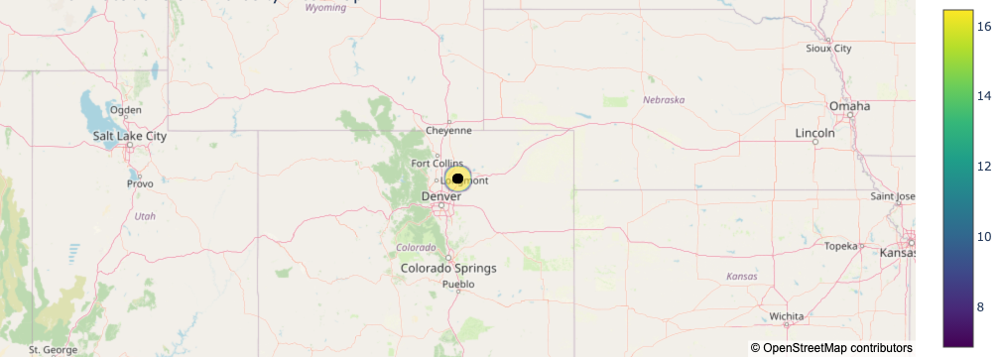

In [917]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming 'data' is a DataFrame with 'Longitude', 'Latitude', 'Porosity', 'Well_No', and 'Oil_Production_Rate'
# Replace 'Oil_Production_Rate' with the actual column name containing the average production rate of each well

# Ensure there are no NaN values in 'Longitude', 'Latitude', and 'Porosity'
data = data.dropna(subset=['Longitude', 'Latitude', 'Porosity'])

# Interpolate the porosity data
grid_x, grid_y = np.mgrid[
    data['Longitude'].min():data['Longitude'].max():100j, 
    data['Latitude'].min():data['Latitude'].max():100j
]
grid_porosity = griddata(
    points=(data['Longitude'], data['Latitude']), 
    values=data['Porosity'], 
    xi=(grid_x, grid_y), 
    method='linear'
)

# Flatten the grid for Plotly
flattened_lon = grid_x.flatten()
flattened_lat = grid_y.flatten()
flattened_porosity = grid_porosity.flatten()

# Start with a basic scatter plot for wells
fig = go.Figure(go.Scattermapbox(
    lat=data['Latitude'],
    lon=data['Longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=9,
        color='black',  # Using a single color for markers
    ),
    text=data['Well_No'],  # Well number will appear on hover
    hoverinfo='text+lon+lat',
))

# Set the layout for the map
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lat=data['Latitude'].mean(), lon=data['Longitude'].mean()),
        zoom=5
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    title='Well Locations and Porosity Heatmap'
)

# Add the heatmap layer for porosity
fig.add_trace(go.Densitymapbox(
    lon=flattened_lon,
    lat=flattened_lat,
    z=flattened_porosity,
    radius=10,
    colorscale='Viridis',
    opacity=0.5,  # Semi-transparent
    showscale=True  # Show color scale for porosity
))

fig.show()


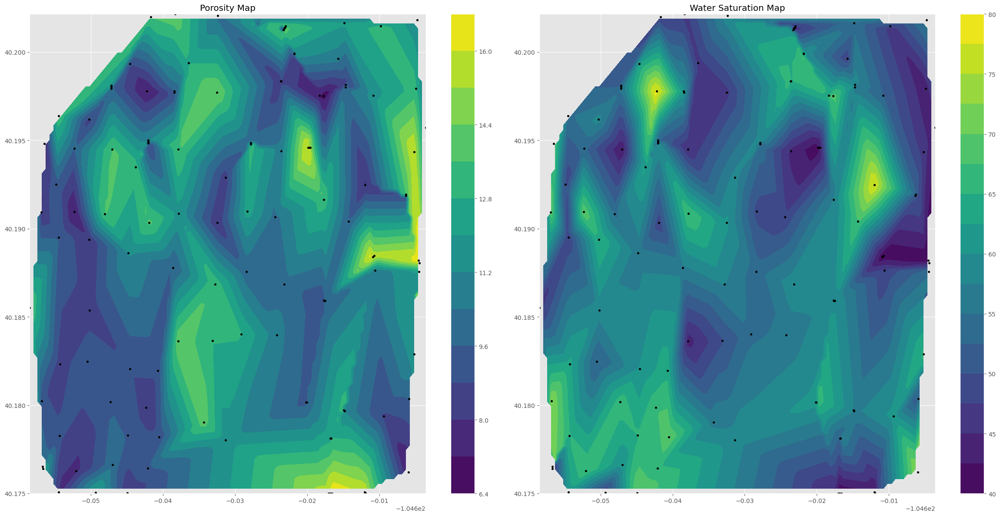

In [918]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming 'data' is the DataFrame already loaded with your geostatistics data
# Remove any rows where 'Porosity' or 'Water_Sat' might be NaN
data = data.dropna(subset=['Porosity', 'Water_Sat'])

# Extracting necessary columns for contour plots
latitude = data['Latitude']
longitude = data['Longitude']
porosity = data['Porosity']
water_saturation = data['Water_Sat']  # Using water saturation instead of permeability

# Grid for interpolation
xi, yi = np.meshgrid(np.linspace(longitude.min(), longitude.max(), 100),
                     np.linspace(latitude.min(), latitude.max(), 100))

# Function to perform interpolation and handle areas with no estimates
def interpolate_with_filling(x, y, z, xi, yi, method='linear'):
    # Perform linear interpolation
    zi = griddata((x, y), z, (xi, yi), method=method)
    # Fill missing values with nearest data point interpolation
    zi_filled = griddata((x, y), z, (xi, yi), method='linear')
    # Use filled values only where original interpolation resulted in NaN
    zi = np.where(np.isnan(zi), zi_filled, zi)
    return zi

# Interpolating porosity and water saturation with full estimates
porosity_interpolated = interpolate_with_filling(longitude, latitude, porosity, xi, yi)
water_saturation_interpolated = interpolate_with_filling(longitude, latitude, water_saturation, xi, yi)

# Plot configurations
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(24, 12))  # Increase figure size

# Porosity Map
contour0 = ax[0].contourf(xi, yi, porosity_interpolated, levels=15, cmap='viridis')
ax[0].scatter(longitude, latitude, c='black', s=10)  # Well locations
ax[0].set_title('Porosity Map')
fig.colorbar(contour0, ax=ax[0])

# Water Saturation Map
contour1 = ax[1].contourf(xi, yi, water_saturation_interpolated, levels=15, cmap='viridis')
ax[1].scatter(longitude, latitude, c='black', s=10)  # Well locations
ax[1].set_title('Water Saturation Map')
fig.colorbar(contour1, ax=ax[1])

plt.tight_layout()
plt.show()


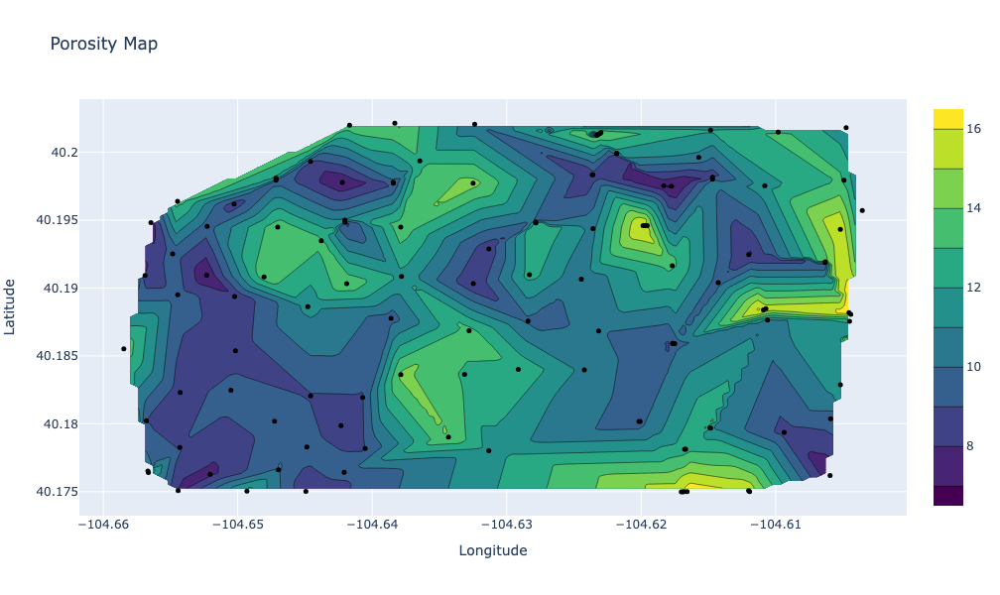

In [919]:
import plotly.graph_objects as go
import numpy as np
from scipy.interpolate import griddata

# Assuming 'data' is the DataFrame already loaded with your geostatistics data
# Remove any rows where 'Porosity' might be NaN
data = data.dropna(subset=['Porosity'])

# Extracting necessary columns
latitude = data['Latitude']
longitude = data['Longitude']
porosity = data['Porosity']

# Grid for interpolation
xi, yi = np.meshgrid(np.linspace(longitude.min(), longitude.max(), 100),
                     np.linspace(latitude.min(), latitude.max(), 100))

# Interpolating porosity
porosity_interpolated = griddata((longitude, latitude), porosity, (xi, yi), method='linear')

# Create the figure for porosity map
fig = go.Figure()

# Add Porosity Contour
fig.add_trace(go.Contour(
    z=porosity_interpolated, 
    x=np.linspace(longitude.min(), longitude.max(), 100), 
    y=np.linspace(latitude.min(), latitude.max(), 100), 
    colorscale='Viridis', 
    name='Porosity'
))

# Add scatter plot for well locations
fig.add_trace(go.Scatter(
    x=longitude, 
    y=latitude, 
    mode='markers', 
    marker=dict(color='black', size=5), 
    name='Well Locations'
))

# Update the layout
fig.update_layout(
    title='Porosity Map', 
    xaxis_title='Longitude', 
    yaxis_title='Latitude',
    hovermode='closest',
    width=800,  # Width of the figure
    height=600   # Height of the figure
)

# Show the figure
fig.show()


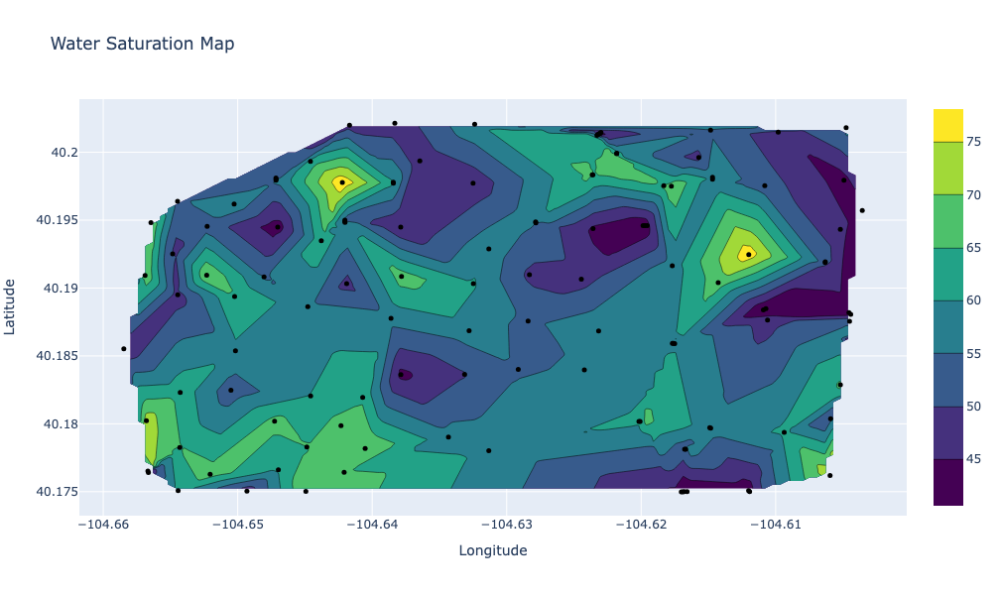

In [920]:
import plotly.graph_objects as go
import numpy as np
from scipy.interpolate import griddata

# Assuming 'data' is the DataFrame already loaded with your geostatistics data
# Remove any rows where 'Water_Sat' might be NaN
data = data.dropna(subset=['Water_Sat'])

# Extracting necessary columns
latitude = data['Latitude']
longitude = data['Longitude']
water_saturation = data['Water_Sat']  # Using water saturation instead of porosity

# Grid for interpolation
xi, yi = np.meshgrid(np.linspace(longitude.min(), longitude.max(), 100),
                     np.linspace(latitude.min(), latitude.max(), 100))

# Interpolating water saturation
water_saturation_interpolated = griddata((longitude, latitude), water_saturation, (xi, yi), method='linear')

# Create the figure for water saturation map
fig = go.Figure()

# Add Water Saturation Contour
fig.add_trace(go.Contour(
    z=water_saturation_interpolated, 
    x=np.linspace(longitude.min(), longitude.max(), 100), 
    y=np.linspace(latitude.min(), latitude.max(), 100), 
    colorscale='Viridis', 
    name='Water Saturation'
))

# Add scatter plot for well locations
fig.add_trace(go.Scatter(
    x=longitude, 
    y=latitude, 
    mode='markers', 
    marker=dict(color='black', size=5), 
    name='Well Locations'
))

# Update the layout
fig.update_layout(
    title='Water Saturation Map', 
    xaxis_title='Longitude', 
    yaxis_title='Latitude',
    hovermode='closest',
    width=800,  # Width of the figure
    height=600   # Height of the figure
)

# Show the figure
fig.show()


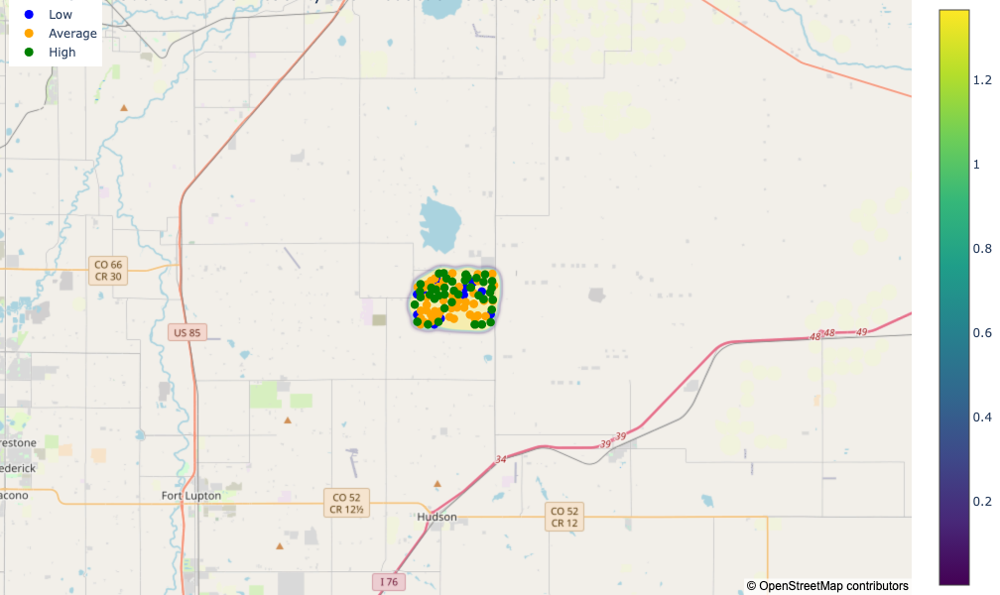

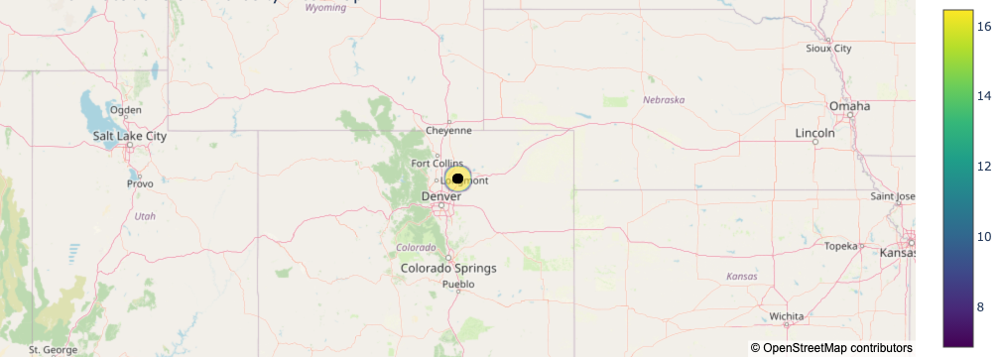

In [921]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming 'data' is a DataFrame with 'Longitude', 'Latitude', 'Porosity', 'Well_No', and 'Oil_Production_Rate'
# Replace 'Oil_Production_Rate' with the actual column name containing the average production rate of each well

# Ensure there are no NaN values in 'Longitude', 'Latitude', and 'Porosity'
data = data.dropna(subset=['Longitude', 'Latitude', 'Porosity'])

# Interpolate the porosity data
grid_x, grid_y = np.mgrid[
    data['Longitude'].min():data['Longitude'].max():100j, 
    data['Latitude'].min():data['Latitude'].max():100j
]
grid_porosity = griddata(
    points=(data['Longitude'], data['Latitude']), 
    values=data['Porosity'], 
    xi=(grid_x, grid_y), 
    method='linear'
)

# Flatten the grid for Plotly
flattened_lon = grid_x.flatten()
flattened_lat = grid_y.flatten()
flattened_porosity = grid_porosity.flatten()

# Start with a basic scatter plot for wells
fig = go.Figure(go.Scattermapbox(
    lat=data['Latitude'],
    lon=data['Longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=9,
        color='black',  # Using a single color for markers
    ),
    text=data['Well_No'],  # Well number will appear on hover
    hoverinfo='text+lon+lat',
))

# Set the layout for the map
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lat=data['Latitude'].mean(), lon=data['Longitude'].mean()),
        zoom=5
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    title='Well Locations and Porosity Heatmap'
)

# Add the heatmap layer for porosity
fig.add_trace(go.Densitymapbox(
    lon=flattened_lon,
    lat=flattened_lat,
    z=flattened_porosity,
    radius=10,
    colorscale='Viridis',
    opacity=0.5,  # Semi-transparent
    showscale=True  # Show color scale for porosity
))

fig.show()


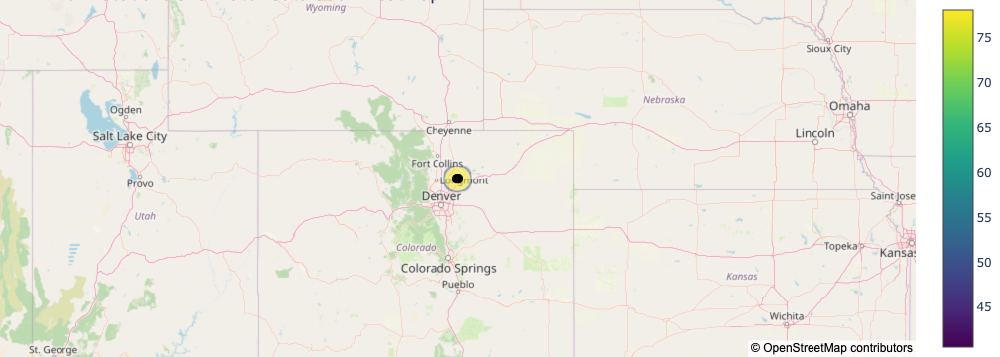

In [922]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming 'data' is a DataFrame with 'Longitude', 'Latitude', 'Water_Sat', 'Well_No', and other relevant columns
# Ensure there are no NaN values in 'Longitude', 'Latitude', and 'Water_Sat'
data = data.dropna(subset=['Longitude', 'Latitude', 'Water_Sat'])

# Interpolate the water saturation data
grid_x, grid_y = np.mgrid[
    data['Longitude'].min():data['Longitude'].max():100j, 
    data['Latitude'].min():data['Latitude'].max():100j
]
grid_water_saturation = griddata(
    points=(data['Longitude'], data['Latitude']), 
    values=data['Water_Sat'], 
    xi=(grid_x, grid_y), 
    method='linear'
)

# Flatten the grid for Plotly
flattened_lon = grid_x.flatten()
flattened_lat = grid_y.flatten()
flattened_water_saturation = grid_water_saturation.flatten()

# Start with a basic scatter plot for wells
fig = go.Figure(go.Scattermapbox(
    lat=data['Latitude'],
    lon=data['Longitude'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=9,
        color='black',  # Using a single color for markers
    ),
    text=data['Well_No'],  # Well number will appear on hover
    hoverinfo='text+lon+lat',
))

# Set the layout for the map
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lat=data['Latitude'].mean(), lon=data['Longitude'].mean()),
        zoom=5
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    title='Well Locations and Water Saturation Heatmap'
)

# Add the heatmap layer for water saturation
fig.add_trace(go.Densitymapbox(
    lon=flattened_lon,
    lat=flattened_lat,
    z=flattened_water_saturation,
    radius=10,
    colorscale='Viridis',
    opacity=0.5,  # Semi-transparent
    showscale=True  # Show color scale for water saturation
))

fig.show()

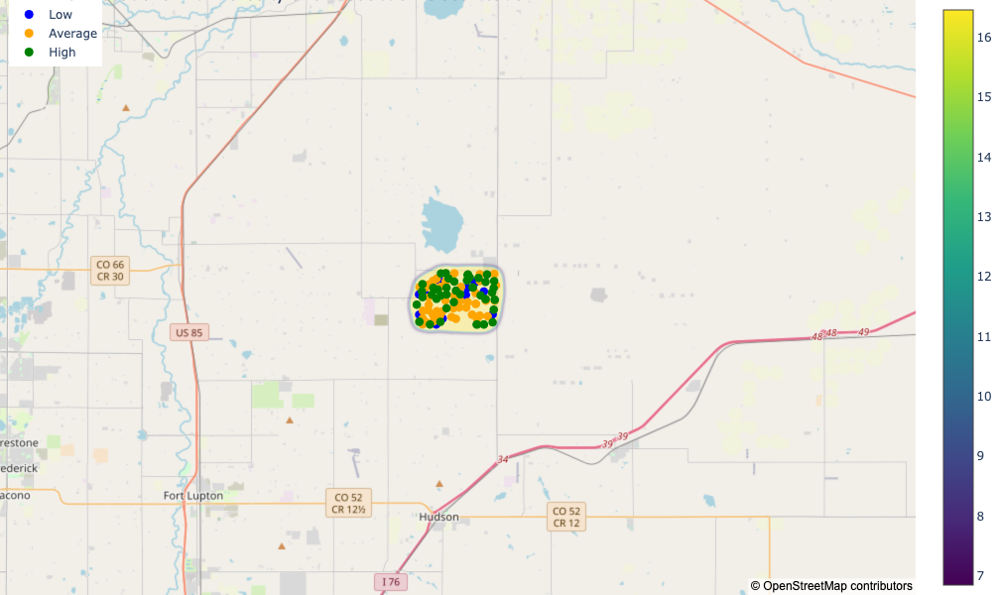

In [923]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming 'data' is the DataFrame already loaded with your geostatistics data
# Do not drop rows with missing porosity data
data = data.dropna(subset=['Longitude', 'Latitude'])

# Prepare the color map for well production classification
color_discrete_map = {'Low': 'blue', 'Average': 'orange', 'High': 'green', 'Very High': 'red', 'No Value': 'gray'}

# Add a 'No Value' category for wells without a production classification
data['Production_Class'] = data['Production_Class'].fillna('No Value')

# Filter data for interpolation to exclude rows where 'Porosity' is NaN
interpolation_data = data.dropna(subset=['Porosity'])

# Interpolate the porosity data
grid_x, grid_y = np.mgrid[
    interpolation_data['Longitude'].min():interpolation_data['Longitude'].max():100j, 
    interpolation_data['Latitude'].min():interpolation_data['Latitude'].max():100j
]
grid_porosity = griddata(
    points=(interpolation_data['Longitude'], interpolation_data['Latitude']), 
    values=interpolation_data['Porosity'], 
    xi=(grid_x, grid_y), 
    method='linear'
)

# Flatten the grid for Plotly
flattened_lon = grid_x.flatten()
flattened_lat = grid_y.flatten()
flattened_porosity = grid_porosity.flatten()

# Create a figure
fig = go.Figure()

# Add the heatmap layer for porosity
fig.add_trace(go.Densitymapbox(
    lon=flattened_lon,
    lat=flattened_lat,
    z=flattened_porosity,
    radius=10,
    colorscale='Viridis',
    opacity=0.3,
    showscale=True
))

# Add wells with classification colors
for class_name, class_color in color_discrete_map.items():
    class_data = data[data['Production_Class'] == class_name]
    fig.add_trace(go.Scattermapbox(
        lat=class_data['Latitude'],
        lon=class_data['Longitude'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=9,
            color=class_color
        ),
        text=class_data['Well_No'].astype(str) + '<br>Porosity: ' + class_data['Porosity'].astype(str),
        name=class_name
    ))

# Set the layout for the map
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lat=data['Latitude'].mean(), lon=data['Longitude'].mean()),
        zoom=10
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    title='Well Locations with Porosity and Production Classification',
    width=800,  # Width of the figure
    height=600,  # Height of the figure
    legend=dict(
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.01
    )
)

# Show the figure
fig.show()


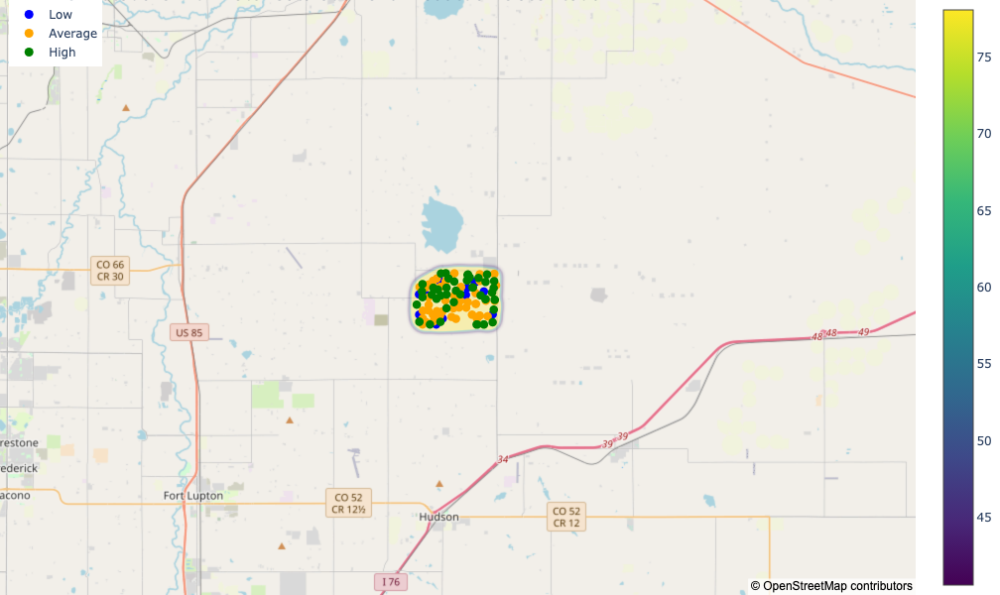

In [925]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming 'data' is the DataFrame already loaded with your geostatistics data
# Do not drop rows with missing water saturation data
data = data.dropna(subset=['Longitude', 'Latitude'])

# Prepare the color map for well production classification
color_discrete_map = {'Low': 'blue', 'Average': 'orange', 'High': 'green', 'Very High': 'red', 'No Value': 'gray'}

# Add a 'No Value' category for wells without a production classification
data['Production_Class'] = data['Production_Class'].fillna('No Value')

# Filter data for interpolation to exclude rows where 'Water_Sat' is NaN
interpolation_data = data.dropna(subset=['Water_Sat'])

# Interpolate the water saturation data
grid_x, grid_y = np.mgrid[
    interpolation_data['Longitude'].min():interpolation_data['Longitude'].max():100j, 
    interpolation_data['Latitude'].min():interpolation_data['Latitude'].max():100j
]
grid_water_saturation = griddata(
    points=(interpolation_data['Longitude'], interpolation_data['Latitude']), 
    values=interpolation_data['Water_Sat'], 
    xi=(grid_x, grid_y), 
    method='linear'
)

# Flatten the grid for Plotly
flattened_lon = grid_x.flatten()
flattened_lat = grid_y.flatten()
flattened_water_saturation = grid_water_saturation.flatten()

# Create a figure
fig = go.Figure()

# Add the heatmap layer for water saturation
fig.add_trace(go.Densitymapbox(
    lon=flattened_lon,
    lat=flattened_lat,
    z=flattened_water_saturation,
    radius=10,
    colorscale='Viridis',
    opacity=0.3,  # Adjust for desired transparency
    showscale=True
))

# Add wells with classification colors
for class_name, class_color in color_discrete_map.items():
    class_data = data[data['Production_Class'] == class_name]
    fig.add_trace(go.Scattermapbox(
        lat=class_data['Latitude'],
        lon=class_data['Longitude'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=9,
            color=class_color
        ),
        text=class_data['Well_No'].astype(str) + '<br>Water Saturation: ' + class_data['Water_Sat'].astype(str),
        name=class_name
    ))

# Set the layout for the map
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lat=data['Latitude'].mean(), lon=data['Longitude'].mean()),
        zoom=10  # Adjust zoom level as needed
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    title='Well Locations with Water Saturation and Production Classification',
    width=800,  # Width of the figure
    height=600,  # Height of the figure
    legend=dict(
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.01
    )
)

# Show the figure
fig.show()


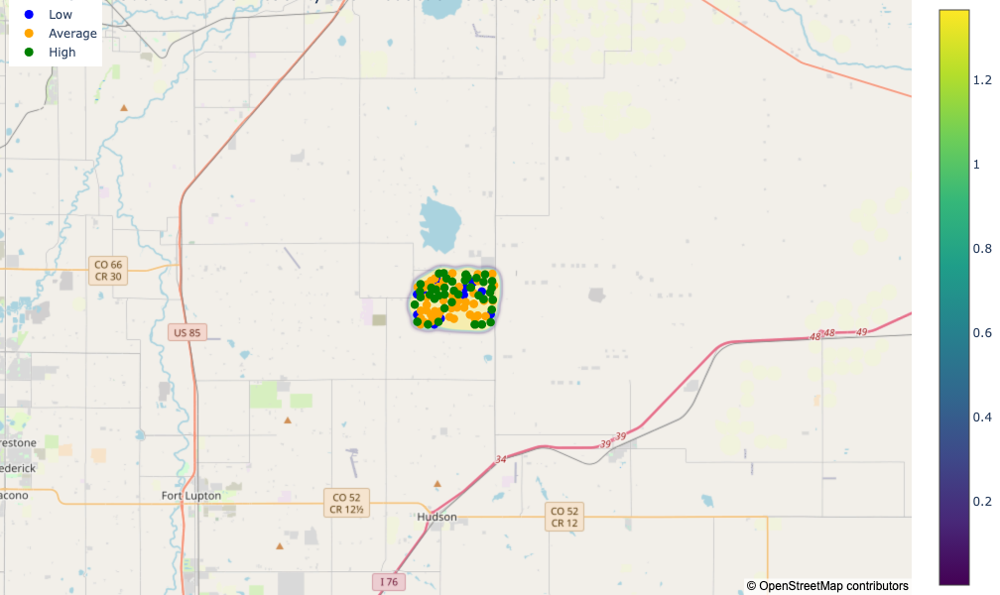

In [926]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming 'data' is your DataFrame with geostatistics data

# Prepare the color map for well production classification
color_discrete_map = {'Low': 'blue', 'Average': 'orange', 'High': 'green', 'Very High': 'red', 'No Value': 'gray'}

# Add a 'No Value' category for wells without a production classification
data['Production_Class'] = data['Production_Class'].fillna('No Value')

# Filter data for interpolation to exclude rows where 'Permeability' is NaN
interpolation_data = data.dropna(subset=['Permeability'])

# Interpolate the permeability data
grid_x, grid_y = np.mgrid[
    interpolation_data['Longitude'].min():interpolation_data['Longitude'].max():100j, 
    interpolation_data['Latitude'].min():interpolation_data['Latitude'].max():100j
]
grid_permeability = griddata(
    points=(interpolation_data['Longitude'], interpolation_data['Latitude']), 
    values=interpolation_data['Permeability'], 
    xi=(grid_x, grid_y), 
    method='linear'
)

# Flatten the grid for Plotly
flattened_lon = grid_x.flatten()
flattened_lat = grid_y.flatten()
flattened_permeability = grid_permeability.flatten()

# Create a figure
fig = go.Figure()

# Add the heatmap layer for permeability
fig.add_trace(go.Densitymapbox(
    lon=flattened_lon,
    lat=flattened_lat,
    z=flattened_permeability,
    radius=10,
    colorscale='Viridis',
    opacity=0.3,  # Adjust for desired transparency
    showscale=True
))

# Add wells with classification colors
for class_name, class_color in color_discrete_map.items():
    class_data = data[data['Production_Class'] == class_name]
    fig.add_trace(go.Scattermapbox(
        lat=class_data['Latitude'],
        lon=class_data['Longitude'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=9,
            color=class_color
        ),
        text=class_data['Well_No'].astype(str) + '<br>Permeability: ' + class_data['Permeability'].astype(str),
        name=class_name
    ))

# Set the layout for the map
fig.update_layout(
    mapbox=dict(
        style='open-street-map',
        center=dict(lat=data['Latitude'].mean(), lon=data['Longitude'].mean()),
        zoom=10  # Adjust zoom level as needed
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    title='Well Locations with Permeability and Production Classification',
    width=800,  # Width of the figure
    height=600,  # Height of the figure
    legend=dict(
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.01
    )
)

# Show the figure
fig.show()


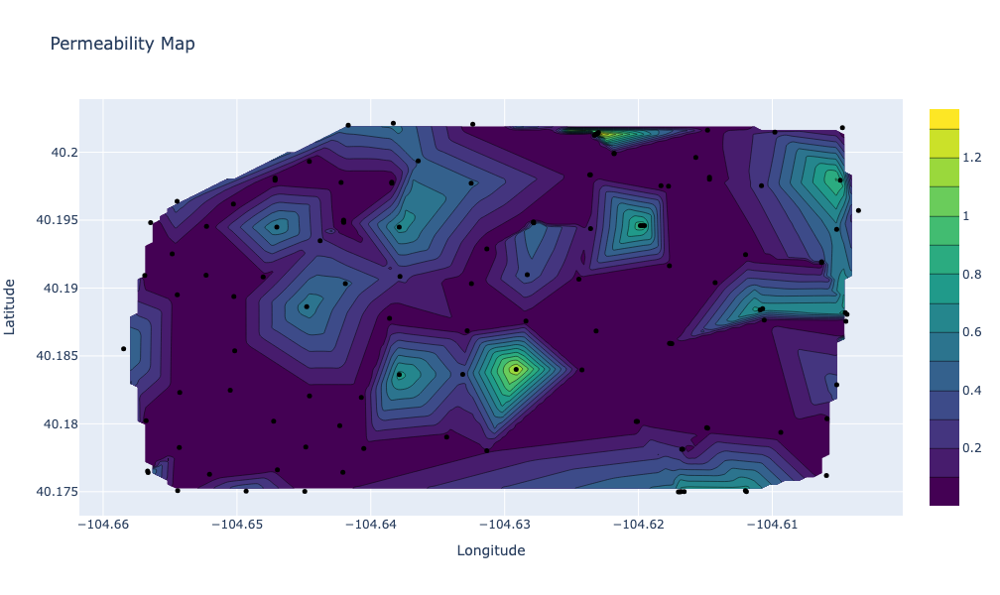

In [927]:
import numpy as np
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Assuming 'data' is your DataFrame and it contains 'Longitude', 'Latitude', and 'Permeability' columns

# Remove any rows where 'Permeability' might be NaN
data = data.dropna(subset=['Permeability'])

# Extracting necessary columns
latitude = data['Latitude']
longitude = data['Longitude']
permeability = data['Permeability']

# Grid for interpolation
xi, yi = np.meshgrid(np.linspace(longitude.min(), longitude.max(), 100),
                     np.linspace(latitude.min(), latitude.max(), 100))

# Interpolating permeability
permeability_interpolated = griddata((longitude, latitude), permeability, (xi, yi), method='linear')

# Create the figure for permeability map
fig = go.Figure()

# Add Permeability Contour
fig.add_trace(go.Contour(
    z=permeability_interpolated, 
    x=np.linspace(longitude.min(), longitude.max(), 100), 
    y=np.linspace(latitude.min(), latitude.max(), 100), 
    colorscale='Viridis', 
    name='Permeability'
))

# Add scatter plot for well locations
fig.add_trace(go.Scatter(
    x=longitude, 
    y=latitude, 
    mode='markers', 
    marker=dict(color='black', size=5), 
    name='Well Locations'
))

# Update the layout
fig.update_layout(
    title='Permeability Map', 
    xaxis_title='Longitude', 
    yaxis_title='Latitude',
    hovermode='closest',
    width=800,  # Width of the figure
    height=600   # Height of the figure
)

# Show the figure
fig.show()


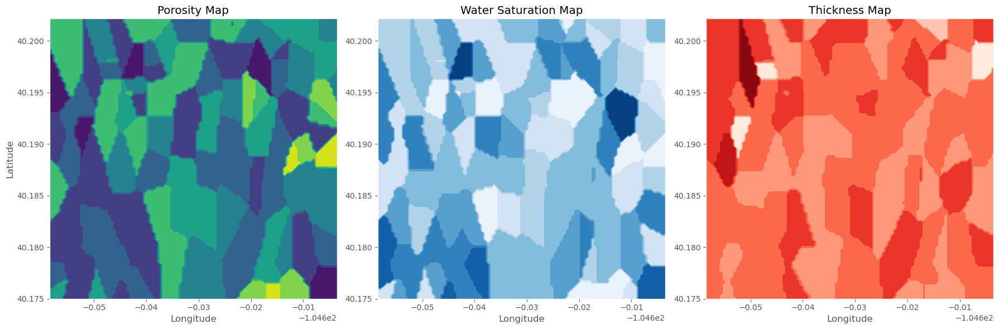

In [928]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.interpolate import griddata

# Assuming your data is in a DataFrame named 'data'
x, y, poro, sw, h = data['Longitude'], data['Latitude'], data['Porosity'], data['Water_Sat'], data['Pay_thickness ']

# Convert porosity and water saturation from percentages to fractions
poro = poro / 100
sw = sw / 100

# Known parameters

# Create grid data for interpolation
xi = np.linspace(min(x), max(x), 100)
yi = np.linspace(min(y), max(y), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolating data
porosity_interpolated = griddata((x, y), poro, (xi, yi), method='nearest')
water_sat_interpolated = griddata((x, y), sw, (xi, yi), method='nearest')
thickness_interpolated = griddata((x, y), h, (xi, yi), method='nearest')

# Plotting the interpolated data
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Porosity Map
ax[0].contourf(xi, yi, porosity_interpolated, cmap='viridis')
ax[0].set_title('Porosity Map')
ax[0].set_xlabel('Longitude')
ax[0].set_ylabel('Latitude')

# Water Saturation Map
ax[1].contourf(xi, yi, water_sat_interpolated, cmap='Blues')
ax[1].set_title('Water Saturation Map')
ax[1].set_xlabel('Longitude')

# Thickness Map
ax[2].contourf(xi, yi, thickness_interpolated, cmap='Reds')
ax[2].set_title('Thickness Map')
ax[2].set_xlabel('Longitude')

plt.tight_layout()
plt.show()


In [929]:
import pandas as pd

# Function to calculate the NPV with Year-to-Date (YTD) NPV column, with all monetary values in millions
def calculate_npv_with_ytd(daily_rate, oil_cost_per_bbl, interest_rate, drilling_cost, royalty_rate, operating_cost, tax_rate, land_cost):
    data = []  # List to store row data
    ytd_npv = 0  # Year-to-date NPV
    total_barrels = daily_rate * 365  # Total barrels per year
    million = 1_000_000  # Conversion factor to millions

    for year in range(6):
        if year == 0:
            revenue = -drilling_cost / million
            total_deductions = drilling_cost / million
            profit = -drilling_cost / million
            yearly_npv = -drilling_cost / million / (1 + interest_rate) ** year
        else:
            revenue = total_barrels * oil_cost_per_bbl / million
            royalties = revenue * royalty_rate
            taxes = revenue * tax_rate
            operating_expenses = (total_barrels * operating_cost) / million  # Operating cost converted to millions
            land_and_other_deductions = revenue * land_cost
            total_deductions = royalties + taxes + operating_expenses + land_and_other_deductions
            profit = revenue - total_deductions
            yearly_npv = profit / (1 + interest_rate) ** year

        ytd_npv += yearly_npv
        data.append({"Year": year, "Revenue": revenue, "Total Deductions": total_deductions,
                     "Profit": profit, "Yearly NPV": yearly_npv, "YTD NPV": ytd_npv})

    # Adding the cumulative NPV row
    data.append({"Year": "Cumulative", "Revenue": "-", "Total Deductions": "-",
                 "Profit": "-", "Yearly NPV": "-", "YTD NPV": ytd_npv})

    # Create DataFrame from the list of dictionaries
    npv_table = pd.DataFrame(data)
    return npv_table

# User inputs (replace with actual user input in your environment)
projected_daily_oil_rate = float(input("Enter projected daily oil rate (in barrels): "))
projected_oil_cost_per_bbl = float(input("Enter projected oil cost per bbl for the next 5 years: "))

# Fixed inputs, converted to millions where appropriate
interest_rate = 0.0475  # 4.75%
drilling_cost = 2  # $2 million
royalty_rate = 0.15  # 15%
operating_cost = 6  # $6 per bbl
tax_rate = 0.15  # 15% taxes
land_cost = 0.03  # 3%

# Calculate NPV with YTD NPV using the user inputs and fixed values
npv_table_with_ytd = calculate_npv_with_ytd(projected_daily_oil_rate, projected_oil_cost_per_bbl, interest_rate, 
                                            drilling_cost, royalty_rate, operating_cost, tax_rate, land_cost)

# Display the table with YTD NPV
npv_table_with_ytd


Enter projected daily oil rate (in barrels):  100
Enter projected oil cost per bbl for the next 5 years:  75


,Year,Revenue,Total Deductions,Profit,Yearly NPV,YTD NPV
0,0,-0.000002,0.000002,-0.000002,-0.000002,-0.000002
1,1,2.7375,1.122375,1.615125,1.541885,1.541883
2,2,2.7375,1.122375,1.615125,1.471967,3.013850
3,3,2.7375,1.122375,1.615125,1.405219,4.419070
4,4,2.7375,1.122375,1.615125,1.341498,5.760568
5,5,2.7375,1.122375,1.615125,1.280666,7.041234
6,Cumulative,-,-,-,-,7.041234


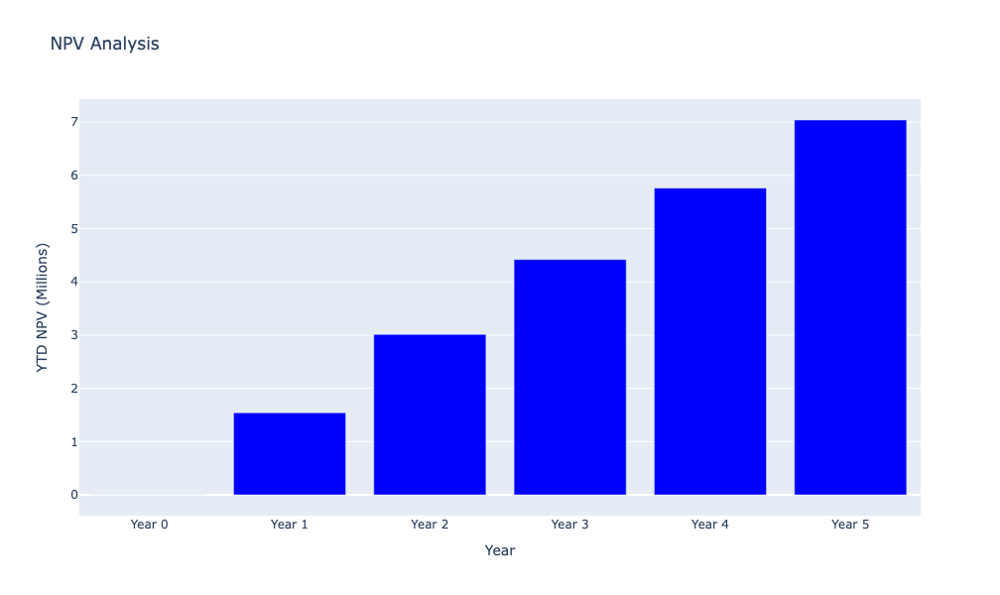

In [931]:
import pandas as pd
import plotly.graph_objects as go

# Assuming 'npv_table_with_ytd' is the DataFrame generated from your previous code

def plot_ytd_npv_per_year(npv_table_with_ytd):
    # Filter out the cumulative row
    annual_data = npv_table_with_ytd[npv_table_with_ytd['Year'] != 'Cumulative']

    # Create the plot
    fig = go.Figure(data=[
        go.Bar(
            x=['Year 0', 'Year 1', 'Year 2', 'Year 3', 'Year 4', 'Year 5'],
            y=annual_data['YTD NPV'],
            marker_color='blue'
        )
    ])

    # Update layout
    fig.update_layout(
        title='NPV Analysis',
        xaxis_title='Year',
        yaxis_title='YTD NPV (Millions)',
        autosize=False,
        width=800,  # Width of the chart
        height=600  # Height of the chart
    )

    fig.show()

# Call the function with your DataFrame
plot_ytd_npv_per_year(npv_table_with_ytd)
